In [1]:
import torch
from torch.utils.data import DataLoader, Dataset
from torch import nn, optim
import torchvision.models as models
import pytorch_warmup as warmup

from albumentations.pytorch import ToTensorV2
import albumentations as A

from tqdm import tqdm, tqdm_notebook
import cv2
import copy
import random
import math
import os
import pandas as pd
import numpy as np
from collections import OrderedDict
from PIL import Image, ImageDraw

from matplotlib import colors, pyplot as plt
from matplotlib import image as mpimg
%matplotlib inline

train_on_gpu = torch.cuda.is_available()

if not train_on_gpu:
    print('CUDA is not available.  Training on CPU ...')
else:
    print('CUDA is available!  Training on GPU ...')
    DEVICE = torch.device("cuda:0")

# в sklearn не все гладко, чтобы было удобно выводить картинки
# мы будем игнорировать warnings
import warnings
warnings.filterwarnings(action='ignore', category=DeprecationWarning)

CUDA is available!  Training on GPU ...


In [365]:
# Путь к тестовой папке
directory = 'test'
test_files = [entry.name for entry in os.scandir(directory) if entry.is_file()]
test_files.sort()

# Pre-processing

## Checking dataset integrity

In [3]:
df = pd.read_csv('train.csv')
df['filename'] = df['filename'].apply(lambda text: 'train/'+text)
df.head()

,filename,x1,y1,x2,y2,x3,y3,x4,y4,x5,...,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14
0,train/05317.jpg,25,55,63,39,145,36,171,45,39,...,159,65,113,103,79,148,113,148,143,141
1,train/04767.jpg,17,32,39,27,56,22,81,16,20,...,86,28,56,66,45,80,59,80,74,76
2,train/05241.jpg,33,44,70,44,119,41,142,41,33,...,144,56,94,101,74,135,89,135,112,133
3,train/03849.jpg,96,157,222,143,389,129,517,125,153,...,467,188,328,339,241,451,335,453,419,441
4,train/00952.jpg,13,19,30,16,51,17,66,16,18,...,59,23,39,43,31,56,41,56,49,55


In [4]:
# все данные целые
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 29 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  5000 non-null   object
 1   x1        5000 non-null   int64 
 2   y1        5000 non-null   int64 
 3   x2        5000 non-null   int64 
 4   y2        5000 non-null   int64 
 5   x3        5000 non-null   int64 
 6   y3        5000 non-null   int64 
 7   x4        5000 non-null   int64 
 8   y4        5000 non-null   int64 
 9   x5        5000 non-null   int64 
 10  y5        5000 non-null   int64 
 11  x6        5000 non-null   int64 
 12  y6        5000 non-null   int64 
 13  x7        5000 non-null   int64 
 14  y7        5000 non-null   int64 
 15  x8        5000 non-null   int64 
 16  y8        5000 non-null   int64 
 17  x9        5000 non-null   int64 
 18  y9        5000 non-null   int64 
 19  x10       5000 non-null   int64 
 20  y10       5000 non-null   int64 
 21  x11       5000

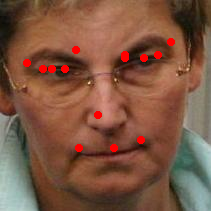

In [5]:
# Заметил, что некоторые из фоток плохо размечены, например как тут с носом и левой бровью

path = '02882.jpg'

image = Image.open(f"train/{path}")
cur_width, cur_height = image.size

draw = ImageDraw.Draw(image)

temp = df.loc[df['filename'] == 'train/'+path].iloc[:, 1:].values.flatten()
temp = [temp[i] for i in range(28)]

for i in range(len(temp) // 2):
    draw.regular_polygon((int(temp[2 * i]), int(temp[2 * i + 1]), 4), n_sides=12, fill=(256, 0, 0))  # Draw red dots

image.show()

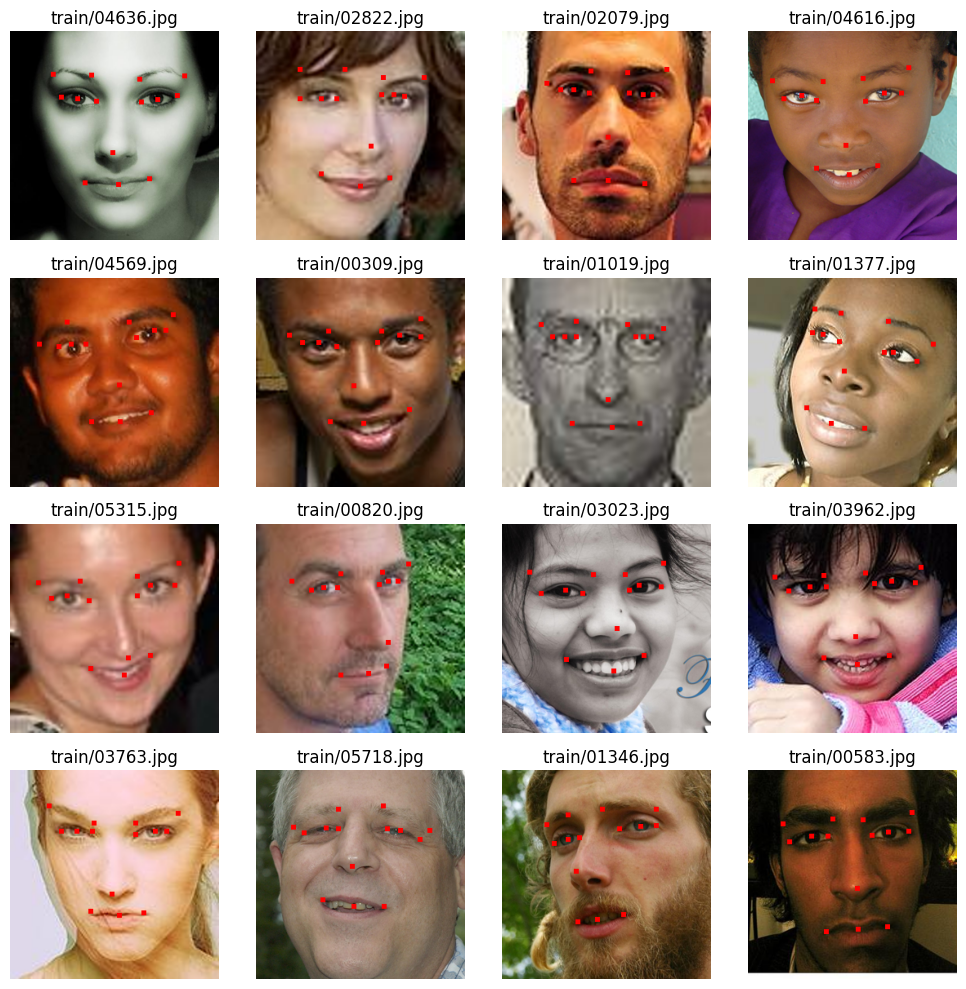

In [15]:
# Create subplots
fig, ax = plt.subplots(nrows=4, ncols=4, figsize=(10, 10), sharey=True, sharex=True)

for fig_x in ax.flatten():
    random_sample = df.sample(1)
    # Open the image
    path = random_sample['filename'].values[0]
    image = Image.open(path)
    cur_width, cur_height = image.size
    new_width, new_height = 256, 256  # Определяю фиксированную длину и ширину для resize
    image = image.resize((new_width, new_height))
    
    # Create a drawing object
    draw = ImageDraw.Draw(image)
    
    # Get facial landmark coordinates and normalize them
    temp = df.loc[df['filename'] == path].iloc[:, 1:].values.flatten()
    temp = [temp[i] / cur_width * new_width if i % 2 == 0 else temp[i] / cur_height * new_height for i in range(28)]
    
    # Draw the landmarks
    for i in range(len(temp) // 2):
        draw.regular_polygon((int(temp[2 * i]), int(temp[2 * i + 1]), 4), n_sides=4, fill=(256, 0, 0))  # Draw red dots
    
    # Convert PIL image to numpy array
    img_array = np.array(image)
    
    # Add title to the subplot
    fig_x.set_title(path)
    
    # Display the image on the subplot
    fig_x.imshow(img_array)
    
    # Hide axes
    fig_x.axis('off')

plt.tight_layout()
plt.show()

## Dataset class

In [16]:
# разные режимы датасета
DATA_MODES = ['train', 'val', 'test']
# все изображения будут масштабированы к размеру 256x256 px
RESCALE_SIZE = 256

class FacialKeypointDataset(Dataset):
    def __init__(self, dataframe, mode='train', transform=None):
        super().__init__()
        self.data = dataframe
        self.category_names = list(df.columns[1:])
        self.transform = transform
        self.mode = mode

        if self.mode not in DATA_MODES:
                print(f"{self.mode} is not correct; correct modes: {DATA_MODES}")
                raise NameError

    def __len__(self):
        return len(self.data)

    def load_sample(self, file):
        image = Image.open(file)
        image.load()
        return image

    def __getitem__(self, index):
        
        image = self.load_sample(self.data.iloc[index, 0])
        image = self._prepare_sample(image)
        
        if self.mode != 'test':
            labels = np.array(self.data.iloc[index, 1:].tolist())
        else:
            labels = np.zeros(28)
        
        labels = labels.reshape(14, 2)
        

        if self.transform:
            try:
                image = image.astype(np.uint8)
                augmentations = self.transform(image=image, keypoints=labels)
            except:
                # Если изображение черно белое(имеет только один канал)
                image = np.dstack((image, image, image)).astype(np.uint8)
                augmentations = self.transform(image=image, keypoints=labels)
            finally:
                image = augmentations["image"]
                labels = augmentations["keypoints"]
                # в Albumentation Flip работает не так как нужно, т.к. он не учитывает, что нужно менять местами точки в векторе
                # из-за чего модель максимально центрирует все точки ближе к середине лица
                if random.random() <= 0.5 and self.mode == 'train':
                    image, labels = horizontal_flip(image, labels)

        # Перевожу точки в отрезок [-1,1]
        labels = np.array(labels).reshape(-1)
        labels = labels/ RESCALE_SIZE * 2 - 1        
        
        return image, labels.astype(np.float32)

    def _prepare_sample(self, image):
        return np.array(image).astype(np.float32)

## Transform

In [366]:
# Находим среднюю и стандартное отклонение по всем фоткам
mean = np.array([0.,0.,0.])
stdTemp = np.array([0.,0.,0.])
std = np.array([0.,0.,0.])

for i in df['filename']:
    im = cv2.imread(i)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    im = im.astype(float) / 255.
    
    for j in range(3):
        mean[j] += np.mean(im[:,:,j])

mean = (mean/5000)

for i in df['filename']:
    im = cv2.imread(i)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    im = im.astype(float) / 255.
    for j in range(3):
        stdTemp[j] += ((im[:,:,j] - mean[j])**2).sum()/(im.shape[0]*im.shape[1])

std = np.sqrt(stdTemp/5000)

print(mean)
print(std)

In [18]:
# Транформы с помощью библеотеки Albumentations
train_transforms = A.Compose(
    [
        A.Resize(width=RESCALE_SIZE, height=RESCALE_SIZE),
        A.Rotate(limit=15, border_mode=cv2.BORDER_CONSTANT, p=0.8),
        A.Affine(shear=15, scale=1.0, p=0.2),
        # A.HorizontalFlip(p=0.5), #провлема с тем что лейблы меняют положение и из-за этого модель центрирует предикты 
        A.RandomBrightnessContrast(p=0.2),
        # A.ElasticTransform(p=0.2), # в некоторых обсуждениях на kaggle читал, что эта аугменттация очень помогла, но я не нашёл способа перевести точки 
        A.OneOf([
            A.GaussNoise(p=0.8),
            A.CLAHE(p=0.8),
            A.ImageCompression(p=0.8),
            A.RandomGamma(p=0.8),
            A.Posterize(p=0.8),
            A.Blur(p=0.8),
        ], p=1.0),
        A.OneOf([
            A.GaussNoise(p=0.8),
            A.CLAHE(p=0.8),
            A.ImageCompression(p=0.8),
            A.RandomGamma(p=0.8),
            A.Posterize(p=0.8),
            A.Blur(p=0.8),
        ], p=1.0),
        A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=0, p=0.2, border_mode=cv2.BORDER_CONSTANT),
        A.Normalize(
            mean=[0.53626275, 0.43044947, 0.37524623], #[0.4897, 0.4897, 0.4897], в случае если нужно будет использовать grayscale
            std=[0.28312593, 0.25985858, 0.25689871], #[0.2330, 0.2330, 0.2330], в случае если нужно будет использовать grayscale
            max_pixel_value=255.0,
        ),
        ToTensorV2(),
    ], keypoint_params=A.KeypointParams(format="xy", remove_invisible=False),
)


val_transforms = A.Compose(
    [
        A.Resize(height=RESCALE_SIZE, width=RESCALE_SIZE),
        A.Normalize(
            mean=[0.53626275, 0.43044947, 0.37524623], #[0.4897, 0.4897, 0.4897], в случае если нужно будет использовать grayscale
            std=[0.28312593, 0.25985858, 0.25689871], #[0.2330, 0.2330, 0.2330], в случае если нужно будет использовать grayscale
            max_pixel_value=255.0,
        ),
        ToTensorV2(),
    ], keypoint_params=A.KeypointParams(format="xy", remove_invisible=False),
)

In [19]:
# Меняем точки для предотвращения ошибки в сети
swap_labels = {0: 3,
               1: 2,
               2: 1,
               3: 0,
               4: 9,
               5: 8,
               6: 7,
               7: 6,
               8: 5,
               9: 4,
               10: 10,
               11: 13,
               12: 12,
               13: 11}
# Функция зеркального отображения картинки
def horizontal_flip(image, labels):
    image = torch.flip(image, dims=[2])
    # label[0::2] = [RESCALE_SIZE - label[0::2][swap_labels[i]] for i in range(14)]
    # label[1::2] = [label[1::2][swap_labels[i]] for i in range(14)]
    labels = [labels[swap_labels[i]] for i in range(14)]
    labels = [(RESCALE_SIZE-x,y) for x,y in labels]
    return image, labels

In [20]:
dataset = FacialKeypointDataset(df, 'train', train_transforms)

In [367]:
def imshow(inp, title=None, plt_ax=plt, default=False, to_normal=False):
    """Imshow для тензоров"""
    inp = inp.numpy().transpose((1, 2, 0))
    if to_normal:
        mean = np.array([0.53626275, 0.43044947, 0.37524623])
        std = np.array([0.28312593, 0.25985858, 0.25689871])
        inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    
    plt_ax.imshow(inp)
    if title is not None:
        plt_ax.set_title(title)
    plt_ax.grid(False)

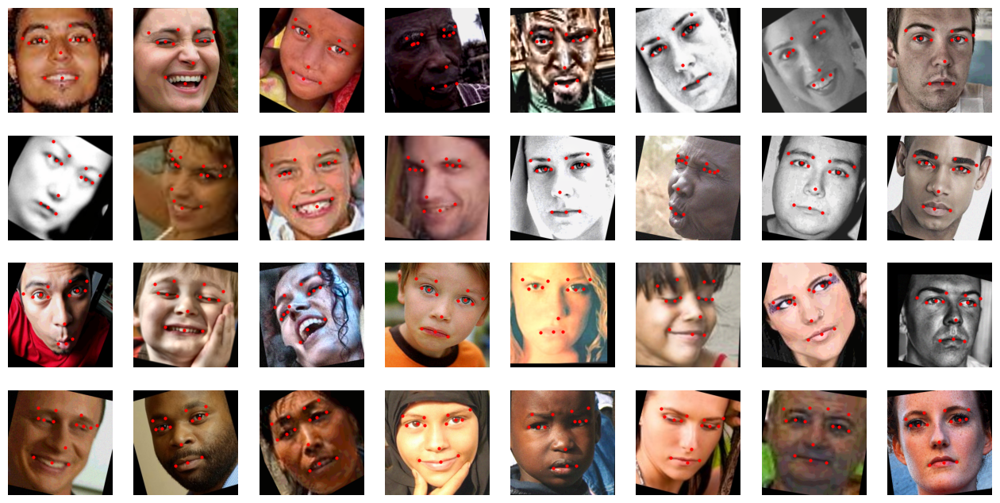

In [22]:
# Создаем объекты для построения графиков
fig, ax = plt.subplots(nrows=4, ncols=8, figsize=(16, 8), sharey=True, sharex=True)

for fig_x in ax.flatten():    
    i = int(np.random.uniform(0,5000)) 
    # Загружаем изображение и точки из датасета
    im_val, label = dataset[i]
    label = (label+1)*256 / 2 # денормализуем точки
    
    # Показываем изображение на текущем subplot
    imshow(im_val.data.cpu(), plt_ax=fig_x, to_normal=True)
    
    # Получаем координаты точек из метки
    points = label[0::2], label[1::2]
    fig_x.axis('off')
    # Рисуем точки на изображении
    fig_x.plot(points[0], points[1], "ro", markersize=2)

# Train

In [23]:
mean_squared_error = nn.MSELoss(reduction="sum") # Будем считать точность по ней

## Baseline Model

In [ ]:
class BaselineCnn(nn.Module):

    def __init__(self, n_labels):
        super().__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=8, kernel_size=3),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(in_channels=8, out_channels=16, kernel_size=3),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv3 = nn.Sequential(
            nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv4 = nn.Sequential(
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv5 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=96, kernel_size=3),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )

        self.fc1 = nn.Sequential(
            nn.Linear(96 * 6 * 6, 4096),
            nn.ReLU()
        )

        self.fc2 = nn.Sequential(
            nn.Linear(4096, 4096),
            nn.ReLU()
        )

        self.out = nn.Linear(4096, n_labels)


    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)

        x = x.view(x.size(0), -1)

        x = self.fc1(x)
        x = self.fc2(x)

        logits = self.out(x)
        return logits
     

## Plot Utils

In [24]:
# графики минимизации функции потерь и MSE пд конец обучения
def save_plots(train_acc, test_acc, train_loss, test_loss):
    """
    Function to save the loss and accuracy plots to disk.
    """
    # Accuracy plots.
    plt.figure(figsize=(10, 7))
    plt.plot(
        train_acc, color='tab:blue', linestyle='-', 
        label='train accuracy'
    )
    plt.plot(
        test_acc, color='tab:red', linestyle='-', 
        label='test accuracy'
    )
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    
    # Loss plots.
    plt.figure(figsize=(10, 7))
    plt.plot(
        train_loss, color='tab:blue', linestyle='-', 
        label='train loss'
    )
    plt.plot(
        test_loss, color='tab:red', linestyle='-', 
        label='test loss'
    )
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

## Train Utils

In [25]:
def train(model, trainloader, optimizer, criterion, scheduler = None):
    model.train()
    print('Training')
    train_running_loss = 0.0
    train_running_correct = 0.0
    counter = 0
    for i, data in tqdm(enumerate(trainloader), total=len(trainloader)):
        counter += 1
        image, labels = data
        image = image.to(DEVICE)
        labels = labels.to(DEVICE)

        optimizer.zero_grad()
        
        # Forward pass.
        outputs = model(image)
        
        # Вычисляем loss.
        loss = criterion(outputs, labels)
        train_running_loss += loss.item()
        
        # Вычисляем MSE.
        preds = outputs.data
        train_running_correct += mean_squared_error(preds, labels).item()
        
        # Backpropagation
        loss.backward()
        
        # Обнавляем веса.
        optimizer.step()
        if scheduler:
            scheduler.step()
            
    # Loss и MSE на текущей эпохе.
    epoch_loss = train_running_loss / counter
    epoch_acc = train_running_correct / counter
    return epoch_loss, epoch_acc

## Test utils

In [26]:
# Test function.
def test(model, testloader, criterion):
    model.eval()
    print('Test')
    test_running_loss = 0.0
    test_running_correct = 0.0
    counter = 0
    with torch.no_grad():
        for i, data in tqdm(enumerate(testloader), total=len(testloader)):
            counter += 1
            
            image, labels = data
            image = image.to(DEVICE)
            labels = labels.to(DEVICE)
            
            # Forward pass.
            outputs = model(image)
            
            # Вычисляем loss.
            loss = criterion(outputs, labels)
            test_running_loss += loss.item()
            
            # Вычисляем MSE.            
            preds = outputs.data
            test_running_correct += mean_squared_error(preds, labels).item()
        
    # Loss и MSE на текущей эпохе.
    epoch_loss = test_running_loss / counter
    epoch_acc = test_running_correct / counter
    return epoch_loss, epoch_acc

## Train part

In [ ]:
epochs = 32
batch_size = 64
learning_rate = 1e-4
n_labels = 28

In [ ]:
train_ds = FacialKeypointDataset(df[:4000], 'train', train_transforms)
val_ds = FacialKeypointDataset(df[4000:4500], 'val', val_transforms)
test_ds = FacialKeypointDataset(df[4500:], 'val', val_transforms)

train_dataloader = DataLoader(train_ds, batch_size=batch_size, shuffle=True) # sampler=sampler shuffle=True
val_dataloader = DataLoader(val_ds, batch_size=batch_size, shuffle=False)
test_dataloader = DataLoader(test_ds, batch_size=batch_size, shuffle=False)

In [ ]:
baseline_model = BaselineCnn(n_labels).to(DEVICE)

# Optimizer.
optimizer = optim.Adam(baseline_model.parameters(), lr=learning_rate, weight_decay=1e-3)

# Loss function.
criterion = nn.MSELoss(reduction="sum")

In [27]:
# Функция обучения 
def training_loop(model, train_dataloader, val_dataloader, optimizer, criterion, scheduler = None, best_model = None, min_test_acc = np.inf):
    min_test_acc = min_test_acc
    best_model = best_model
    
    train_loss, test_loss = [], []
    train_acc, test_acc = [], []
    
    # Start the training.
    for epoch in range(epochs):
        print(f"[INFO]: Epoch {epoch+1} of {epochs}")
        train_epoch_loss, train_epoch_acc = train(
            model, 
            train_dataloader, 
            optimizer,
            criterion,
            scheduler
        )
        
        test_epoch_loss, test_epoch_acc = test(
            model, 
            val_dataloader, 
            criterion
        )
        
        # Сохраняем наилучшую модель
        if  test_epoch_acc < min_test_acc:
            min_test_acc  = test_epoch_acc
            best_model = copy.deepcopy(model)
        
        train_loss.append(train_epoch_loss)
        test_loss.append(test_epoch_loss)
        train_acc.append(train_epoch_acc)
        test_acc.append(test_epoch_acc)
        print(f"Training loss: {train_epoch_loss:.3f}, training acc: {train_epoch_acc:.3f}")
        print(f"Test loss: {test_epoch_loss:.3f}, test acc: {test_epoch_acc:.3f}")
        print('-'*50)
            
    # Отображаем loss и MSE графики.
    save_plots(
        train_acc, 
        test_acc, 
        train_loss, 
        test_loss,
    )
    print('TRAINING COMPLETE')

    return best_model, min_test_acc

[INFO]: Epoch 1 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:54<00:00,  1.16it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.88it/s]


Training loss: 61.396, training acc: 61.396
Test loss: 19.490, test acc: 19.490
--------------------------------------------------
[INFO]: Epoch 2 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:54<00:00,  1.15it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.87it/s]


Training loss: 37.435, training acc: 37.435
Test loss: 17.992, test acc: 17.992
--------------------------------------------------
[INFO]: Epoch 3 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:54<00:00,  1.16it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.87it/s]


Training loss: 31.000, training acc: 31.000
Test loss: 12.844, test acc: 12.844
--------------------------------------------------
[INFO]: Epoch 4 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:54<00:00,  1.15it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.86it/s]


Training loss: 23.777, training acc: 23.777
Test loss: 11.752, test acc: 11.752
--------------------------------------------------
[INFO]: Epoch 5 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:54<00:00,  1.15it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.78it/s]


Training loss: 20.150, training acc: 20.150
Test loss: 12.188, test acc: 12.188
--------------------------------------------------
[INFO]: Epoch 6 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:55<00:00,  1.14it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.91it/s]


Training loss: 18.414, training acc: 18.414
Test loss: 10.016, test acc: 10.016
--------------------------------------------------
[INFO]: Epoch 7 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:57<00:00,  1.10it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.87it/s]


Training loss: 16.682, training acc: 16.682
Test loss: 9.098, test acc: 9.098
--------------------------------------------------
[INFO]: Epoch 8 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:54<00:00,  1.15it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:03<00:00,  2.59it/s]


Training loss: 15.406, training acc: 15.406
Test loss: 8.599, test acc: 8.599
--------------------------------------------------
[INFO]: Epoch 9 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:56<00:00,  1.11it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.89it/s]


Training loss: 14.528, training acc: 14.528
Test loss: 7.998, test acc: 7.998
--------------------------------------------------
[INFO]: Epoch 10 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:54<00:00,  1.15it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:03<00:00,  2.56it/s]


Training loss: 13.935, training acc: 13.935
Test loss: 7.860, test acc: 7.860
--------------------------------------------------
[INFO]: Epoch 11 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:54<00:00,  1.16it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.88it/s]


Training loss: 13.215, training acc: 13.215
Test loss: 7.230, test acc: 7.230
--------------------------------------------------
[INFO]: Epoch 12 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:54<00:00,  1.15it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.89it/s]


Training loss: 12.360, training acc: 12.360
Test loss: 8.093, test acc: 8.093
--------------------------------------------------
[INFO]: Epoch 13 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:54<00:00,  1.15it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.90it/s]


Training loss: 12.455, training acc: 12.455
Test loss: 7.884, test acc: 7.884
--------------------------------------------------
[INFO]: Epoch 14 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:54<00:00,  1.16it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:03<00:00,  2.47it/s]


Training loss: 11.779, training acc: 11.779
Test loss: 6.395, test acc: 6.395
--------------------------------------------------
[INFO]: Epoch 15 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:53<00:00,  1.17it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.93it/s]


Training loss: 11.349, training acc: 11.349
Test loss: 6.264, test acc: 6.264
--------------------------------------------------
[INFO]: Epoch 16 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:55<00:00,  1.14it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.89it/s]


Training loss: 10.825, training acc: 10.825
Test loss: 6.282, test acc: 6.282
--------------------------------------------------
[INFO]: Epoch 17 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:54<00:00,  1.15it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.93it/s]


Training loss: 10.583, training acc: 10.583
Test loss: 6.071, test acc: 6.071
--------------------------------------------------
[INFO]: Epoch 18 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:57<00:00,  1.09it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.92it/s]


Training loss: 10.589, training acc: 10.589
Test loss: 6.301, test acc: 6.301
--------------------------------------------------
[INFO]: Epoch 19 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:54<00:00,  1.17it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.94it/s]


Training loss: 10.015, training acc: 10.015
Test loss: 8.945, test acc: 8.945
--------------------------------------------------
[INFO]: Epoch 20 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:53<00:00,  1.18it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.93it/s]


Training loss: 9.492, training acc: 9.492
Test loss: 5.374, test acc: 5.374
--------------------------------------------------
[INFO]: Epoch 21 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:55<00:00,  1.14it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.92it/s]


Training loss: 8.491, training acc: 8.491
Test loss: 5.235, test acc: 5.235
--------------------------------------------------
[INFO]: Epoch 22 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:54<00:00,  1.15it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.84it/s]


Training loss: 8.355, training acc: 8.355
Test loss: 5.181, test acc: 5.181
--------------------------------------------------
[INFO]: Epoch 23 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:55<00:00,  1.14it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.89it/s]


Training loss: 8.147, training acc: 8.147
Test loss: 5.529, test acc: 5.529
--------------------------------------------------
[INFO]: Epoch 24 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:54<00:00,  1.16it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.96it/s]


Training loss: 8.135, training acc: 8.135
Test loss: 5.790, test acc: 5.790
--------------------------------------------------
[INFO]: Epoch 25 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:53<00:00,  1.18it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.89it/s]


Training loss: 8.230, training acc: 8.230
Test loss: 4.803, test acc: 4.803
--------------------------------------------------
[INFO]: Epoch 26 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:53<00:00,  1.17it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.89it/s]


Training loss: 6.909, training acc: 6.909
Test loss: 5.673, test acc: 5.673
--------------------------------------------------
[INFO]: Epoch 27 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:54<00:00,  1.16it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.91it/s]


Training loss: 6.823, training acc: 6.823
Test loss: 5.508, test acc: 5.508
--------------------------------------------------
[INFO]: Epoch 28 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:54<00:00,  1.16it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.92it/s]


Training loss: 6.640, training acc: 6.640
Test loss: 4.469, test acc: 4.469
--------------------------------------------------
[INFO]: Epoch 29 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:53<00:00,  1.17it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.90it/s]


Training loss: 6.722, training acc: 6.722
Test loss: 4.736, test acc: 4.736
--------------------------------------------------
[INFO]: Epoch 30 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:53<00:00,  1.17it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.92it/s]


Training loss: 6.497, training acc: 6.497
Test loss: 4.297, test acc: 4.297
--------------------------------------------------
[INFO]: Epoch 31 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:53<00:00,  1.18it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.91it/s]


Training loss: 5.829, training acc: 5.829
Test loss: 4.623, test acc: 4.623
--------------------------------------------------
[INFO]: Epoch 32 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:58<00:00,  1.08it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:03<00:00,  2.47it/s]


Training loss: 5.982, training acc: 5.982
Test loss: 4.513, test acc: 4.513
--------------------------------------------------
TRAINING COMPLETE


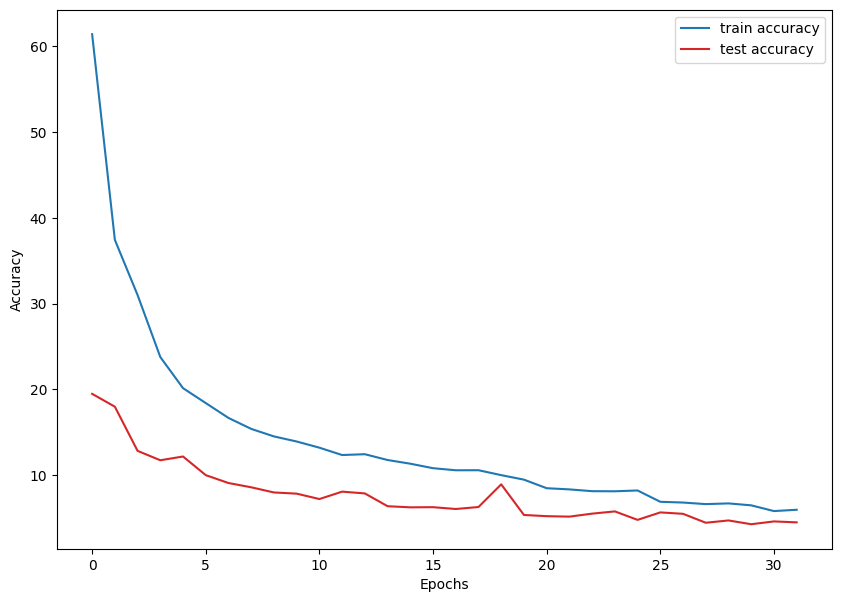

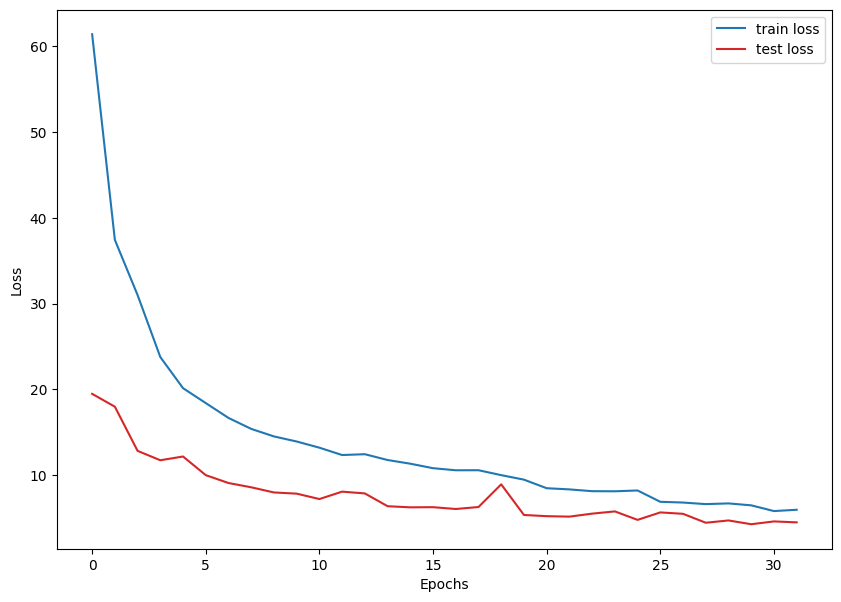

In [189]:
baseline_model_best, _ = training_loop(baseline_model, train_dataloader, val_dataloader, optimizer, criterion)

In [193]:
final_loss, final_acc = test(baseline_model_best, val_dataloader, criterion)
final_loss, final_acc

Test


100%|█████████████████████████████████████████████| 8/8 [00:03<00:00,  2.44it/s]


(4.236272245645523, 4.236272245645523)

In [28]:
def predict_and_show_one_image(model, data):
    with torch.no_grad():
        image, labels = data
        image = image.to(DEVICE)
        
        model.eval()
        outputs = model(image[None, :]).flatten().detach().cpu().numpy()
        
        outputs = (outputs+1) * RESCALE_SIZE /2
        labels = (labels+1) * RESCALE_SIZE /2
        
        fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(4, 4))
        
        # Отображаем изображение на графике
        imshow(image.data.cpu(), plt_ax=ax, to_normal=True)
        
        # Получаем координаты точек из метки
        points = outputs[0::2], outputs[1::2]
        true_points = labels[0::2], labels[1::2]
        
        # Рисуем точки на изображении
        ax.plot(points[0], points[1], "ro", markersize=2) # предикт
        ax.plot(true_points[0], true_points[1], "go", markersize=2, zorder=10) # ground truth
        
        ax.axis('off')
        plt.show()

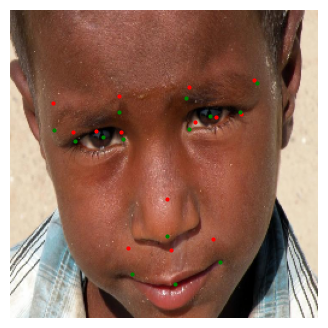

In [259]:
# плохо определённая картинка
predict_and_show_one_image(baseline_model_best, test_ds[3])

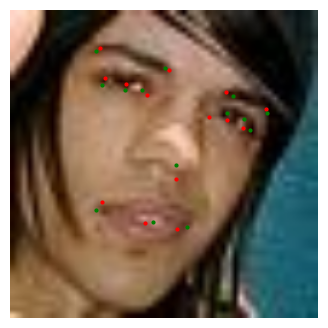

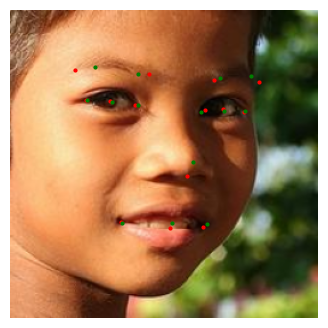

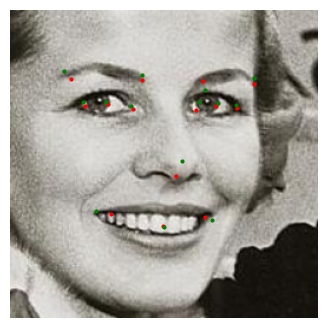

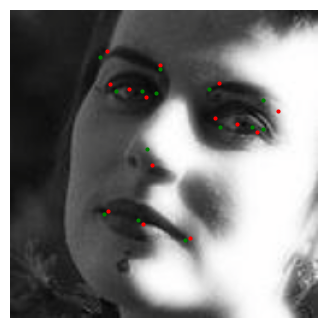

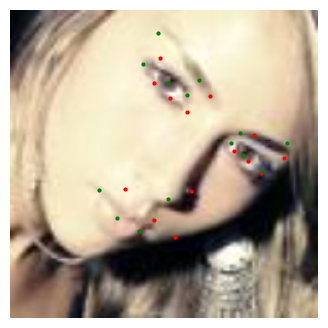

...

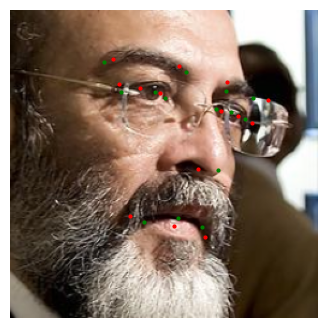

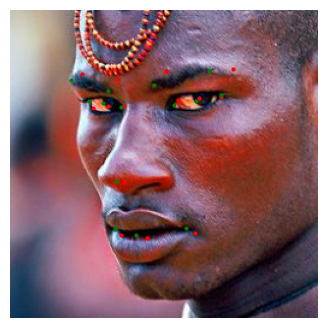

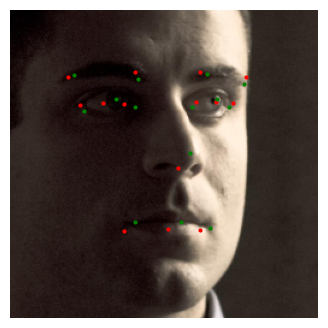

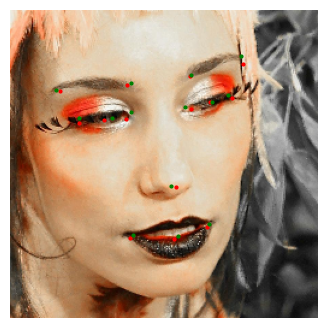

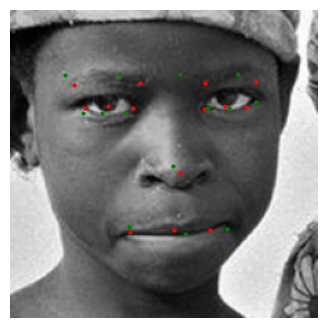

In [52]:
for _ in range(15):
    i = int(np.random.uniform(0,500)) 
    predict_and_show_one_image(baseline_model_best, test_ds[i])

## Using other models and approaches

In [24]:
class ResNet(nn.Module):
    def __init__(self, num_classes=28):
        super(ResNet, self).__init__()
        self.resnet = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
        num_ftrs = self.resnet.fc.in_features
        self.resnet.fc = nn.Linear(num_ftrs, num_classes)

    def forward(self, x):
        x = self.resnet(x)
        return x

In [ ]:
class EfficientNet(nn.Module):
    def __init__(self, num_classes=28):
        super(EfficientNet, self).__init__()
        self.efficientnet = models.efficientnet_b1(weights=models.EfficientNet_B1_Weights.IMAGENET1K_V2)
        
        self.efficientnet.classifier = nn.Sequential(
                                nn.Dropout(p=0.5, inplace=True),
                                nn.Linear(in_features=1280, out_features=num_classes))

    def forward(self, x):
        x = self.efficientnet(x)
        return x

Из [данной статьи](https://arxiv.org/pdf/1711.06753), выясни что Wing Loss лучше подходить, чем обычная L2(впринципе даже L1 подходит лучше чем L2) в данной задаче. Поэтому решил реализовать эту функцию ошибки. По результатам она действительно себя лучше показала, чем MSE, поэтому в дальнейших экспериментах использовал только её.

Также протестил 2 архитектуры, Resnet и EfficientNet. На первой я проверял насколько хорошо модель обучается, используя scheduler'ы, а вторую выбрал как основную и уже оптимизировал под неё гиперпараметры (learning_rate и weight_decay для оптимизаторов)

In [368]:
# Новая функци ошибки, которую упоминали часто в статьях, связанных с facial landmarks detection
class WingLoss(nn.Module):
    def __init__(self, omega=10, epsilon=2):
        super(WingLoss, self).__init__()
        self.omega = omega
        self.epsilon = epsilon

    def forward(self, pred, target):
        y = target
        y_hat = pred
        delta_y = (y - y_hat).abs()
        delta_y1 = delta_y[delta_y < self.omega]
        delta_y2 = delta_y[delta_y >= self.omega]
        loss1 = self.omega * torch.log(1 + delta_y1 / self.epsilon)
        C = self.omega - self.omega * math.log(1 + self.omega / self.epsilon)
        loss2 = delta_y2 - C
        return (loss1.sum() + loss2.sum()) / (len(loss1) + len(loss2))

In [45]:
resnet_model = ResNet(num_classes=n_labels).to(DEVICE)
print(resnet_model)

ResNet(
  (resnet): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

In [46]:
# Optimizer.
optimizer = optim.Adam(resnet_model.parameters(), lr=learning_rate, weight_decay=1e-3)
# scheduler = optim.lr_scheduler.CyclicLR(optimizer, base_lr=1e-4, max_lr=1e-3, cycle_momentum=False, mode="triangular", step_size_up=500)

# Loss function.
# criterion = nn.MSELoss(reduction="sum")
criterion = WingLoss()

[INFO]: Epoch 1 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:58<00:00,  1.07it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:03<00:00,  2.42it/s]


Training loss: 0.855, training acc: 137.436
Test loss: 0.380, test acc: 19.607
--------------------------------------------------
[INFO]: Epoch 2 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:56<00:00,  1.12it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.80it/s]


Training loss: 0.328, training acc: 18.256
Test loss: 0.248, test acc: 9.174
--------------------------------------------------
[INFO]: Epoch 3 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:56<00:00,  1.11it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.78it/s]


Training loss: 0.266, training acc: 12.889
Test loss: 0.216, test acc: 6.984
--------------------------------------------------
[INFO]: Epoch 4 of 32
Training


100%|███████████████████████████████████████████| 63/63 [01:00<00:00,  1.05it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:03<00:00,  2.37it/s]


Training loss: 0.240, training acc: 11.001
Test loss: 0.203, test acc: 5.963
--------------------------------------------------
[INFO]: Epoch 5 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:59<00:00,  1.07it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:03<00:00,  2.38it/s]


Training loss: 0.220, training acc: 9.403
Test loss: 0.186, test acc: 5.041
--------------------------------------------------
[INFO]: Epoch 6 of 32
Training


100%|███████████████████████████████████████████| 63/63 [01:00<00:00,  1.03it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.80it/s]


Training loss: 0.211, training acc: 8.473
Test loss: 0.178, test acc: 4.528
--------------------------------------------------
[INFO]: Epoch 7 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:59<00:00,  1.06it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:03<00:00,  2.38it/s]


Training loss: 0.201, training acc: 7.535
Test loss: 0.166, test acc: 4.036
--------------------------------------------------
[INFO]: Epoch 8 of 32
Training


100%|███████████████████████████████████████████| 63/63 [01:01<00:00,  1.03it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.79it/s]


Training loss: 0.191, training acc: 6.812
Test loss: 0.163, test acc: 3.816
--------------------------------------------------
[INFO]: Epoch 9 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:56<00:00,  1.11it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.80it/s]


Training loss: 0.195, training acc: 6.755
Test loss: 0.160, test acc: 3.641
--------------------------------------------------
[INFO]: Epoch 10 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:57<00:00,  1.09it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.76it/s]


Training loss: 0.186, training acc: 6.252
Test loss: 0.161, test acc: 3.665
--------------------------------------------------
[INFO]: Epoch 11 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:58<00:00,  1.08it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.82it/s]


Training loss: 0.178, training acc: 5.564
Test loss: 0.159, test acc: 3.545
--------------------------------------------------
[INFO]: Epoch 12 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:56<00:00,  1.12it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.82it/s]


Training loss: 0.176, training acc: 5.298
Test loss: 0.153, test acc: 3.318
--------------------------------------------------
[INFO]: Epoch 13 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:56<00:00,  1.12it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.78it/s]


Training loss: 0.181, training acc: 5.240
Test loss: 0.155, test acc: 3.445
--------------------------------------------------
[INFO]: Epoch 14 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:56<00:00,  1.11it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:03<00:00,  2.40it/s]


Training loss: 0.171, training acc: 4.599
Test loss: 0.160, test acc: 3.618
--------------------------------------------------
[INFO]: Epoch 15 of 32
Training


100%|███████████████████████████████████████████| 63/63 [01:01<00:00,  1.03it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.79it/s]


Training loss: 0.168, training acc: 4.304
Test loss: 0.145, test acc: 3.093
--------------------------------------------------
[INFO]: Epoch 16 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:57<00:00,  1.10it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.77it/s]


Training loss: 0.169, training acc: 3.997
Test loss: 0.165, test acc: 3.663
--------------------------------------------------
[INFO]: Epoch 17 of 32
Training


100%|███████████████████████████████████████████| 63/63 [01:00<00:00,  1.04it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:03<00:00,  2.38it/s]


Training loss: 0.163, training acc: 3.764
Test loss: 0.147, test acc: 3.160
--------------------------------------------------
[INFO]: Epoch 18 of 32
Training


100%|███████████████████████████████████████████| 63/63 [01:00<00:00,  1.05it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:03<00:00,  2.64it/s]


Training loss: 0.164, training acc: 3.913
Test loss: 0.158, test acc: 3.456
--------------------------------------------------
[INFO]: Epoch 19 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:58<00:00,  1.07it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.68it/s]


Training loss: 0.160, training acc: 3.577
Test loss: 0.144, test acc: 3.012
--------------------------------------------------
[INFO]: Epoch 20 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:58<00:00,  1.08it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:03<00:00,  2.64it/s]


Training loss: 0.161, training acc: 3.688
Test loss: 0.146, test acc: 3.076
--------------------------------------------------
[INFO]: Epoch 21 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:59<00:00,  1.07it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.67it/s]


Training loss: 0.157, training acc: 3.422
Test loss: 0.142, test acc: 2.976
--------------------------------------------------
[INFO]: Epoch 22 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:59<00:00,  1.05it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:03<00:00,  2.51it/s]


Training loss: 0.164, training acc: 3.804
Test loss: 0.149, test acc: 3.153
--------------------------------------------------
[INFO]: Epoch 23 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:57<00:00,  1.09it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.67it/s]


Training loss: 0.157, training acc: 3.431
Test loss: 0.141, test acc: 2.859
--------------------------------------------------
[INFO]: Epoch 24 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:58<00:00,  1.07it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:03<00:00,  2.62it/s]


Training loss: 0.157, training acc: 3.333
Test loss: 0.147, test acc: 3.088
--------------------------------------------------
[INFO]: Epoch 25 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:58<00:00,  1.09it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:03<00:00,  2.65it/s]


Training loss: 0.158, training acc: 3.393
Test loss: 0.144, test acc: 3.071
--------------------------------------------------
[INFO]: Epoch 26 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:58<00:00,  1.08it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:03<00:00,  2.63it/s]


Training loss: 0.157, training acc: 3.360
Test loss: 0.142, test acc: 2.896
--------------------------------------------------
[INFO]: Epoch 27 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:58<00:00,  1.07it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:03<00:00,  2.52it/s]


Training loss: 0.152, training acc: 3.199
Test loss: 0.139, test acc: 2.852
--------------------------------------------------
[INFO]: Epoch 28 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:57<00:00,  1.09it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:03<00:00,  2.65it/s]


Training loss: 0.153, training acc: 3.230
Test loss: 0.143, test acc: 2.923
--------------------------------------------------
[INFO]: Epoch 29 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:58<00:00,  1.08it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.67it/s]


Training loss: 0.151, training acc: 3.308
Test loss: 0.139, test acc: 2.872
--------------------------------------------------
[INFO]: Epoch 30 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:57<00:00,  1.09it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.69it/s]


Training loss: 0.152, training acc: 3.175
Test loss: 0.146, test acc: 3.110
--------------------------------------------------
[INFO]: Epoch 31 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:57<00:00,  1.09it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.70it/s]


Training loss: 0.152, training acc: 3.221
Test loss: 0.143, test acc: 3.047
--------------------------------------------------
[INFO]: Epoch 32 of 32
Training


100%|███████████████████████████████████████████| 63/63 [00:56<00:00,  1.11it/s]


Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.69it/s]


Training loss: 0.151, training acc: 3.202
Test loss: 0.138, test acc: 2.819
--------------------------------------------------
TRAINING COMPLETE


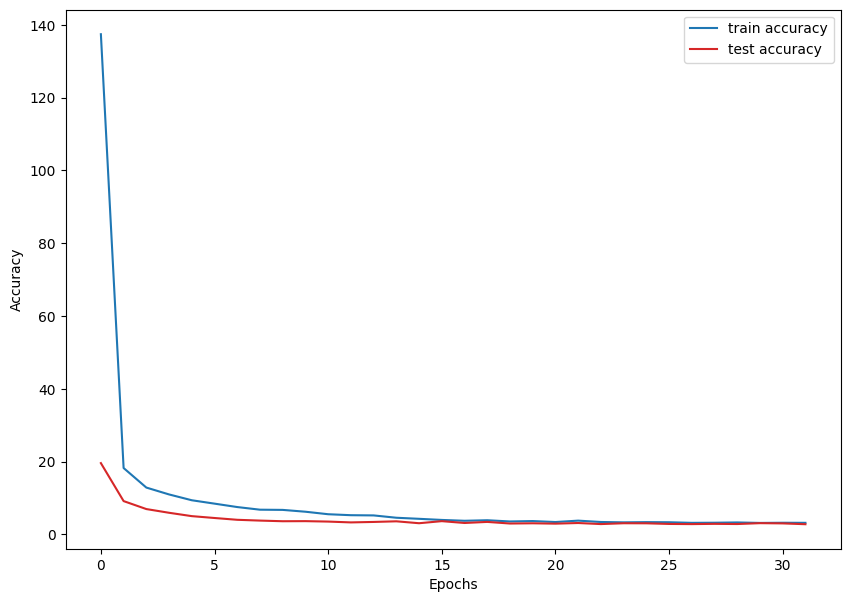

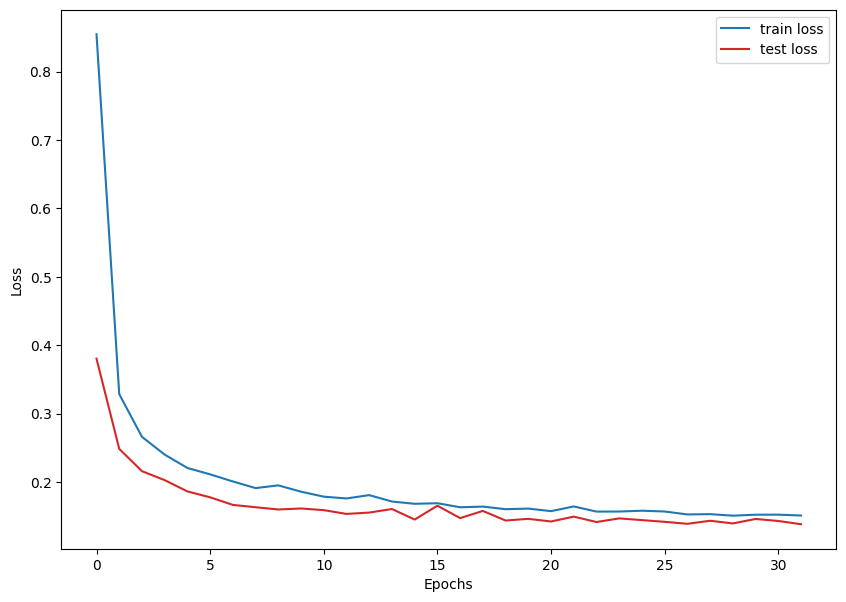

In [89]:
resnet_model_best, min_test_loss = training_loop(resnet_model, train_dataloader, val_dataloader, optimizer, criterion)

In [90]:
min_test_loss

2.81898695230484

In [91]:
final_loss, final_acc = test(resnet_model_best, test_dataloader, criterion)
final_loss, final_acc

Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  2.92it/s]


(0.1371219465509057, 2.56070913374424)

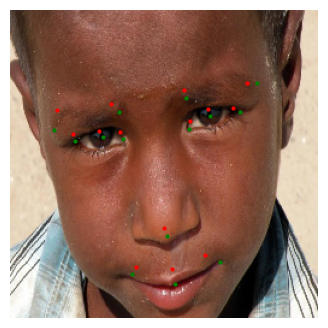

In [92]:
# плохо определённая картинка на бейзлайне стала намного лучше
predict_and_show_one_image(resnet_model_best, test_ds[3])

id: 317


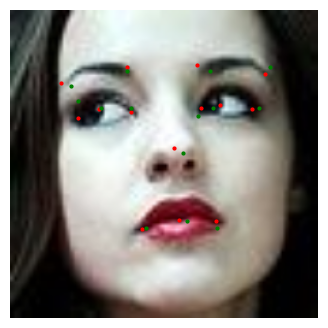

id: 119


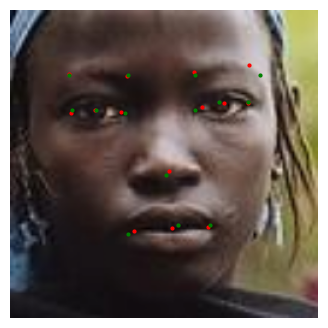

id: 394


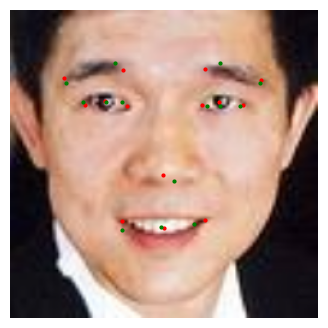

id: 164


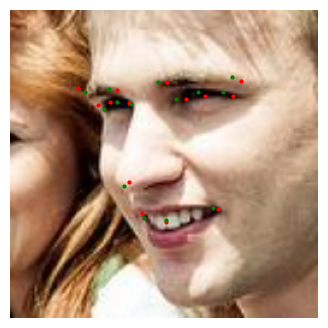

id: 72


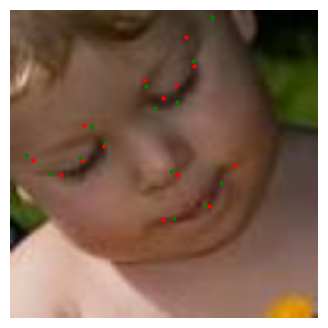

id: 0


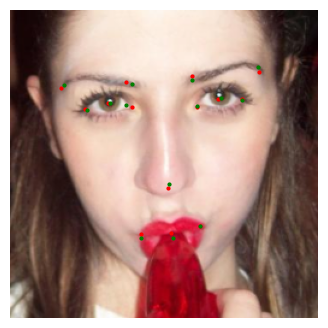

id: 308


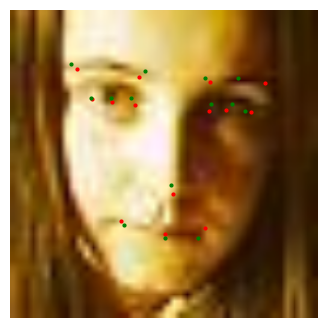

id: 194


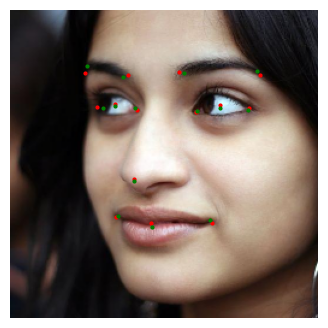

id: 313


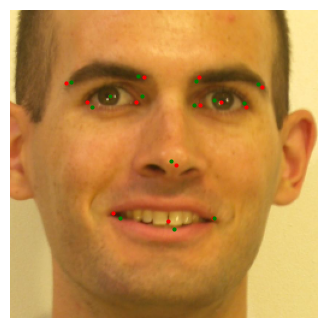

id: 411


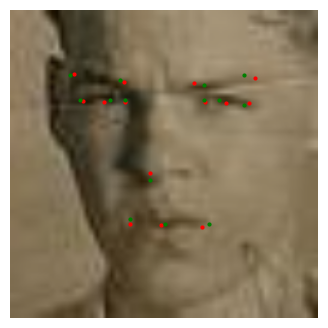

id: 349


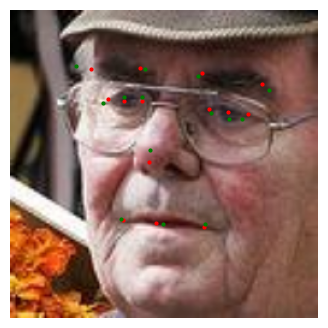

id: 416


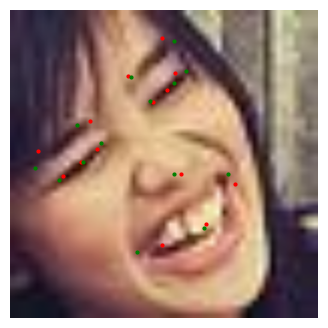

id: 54


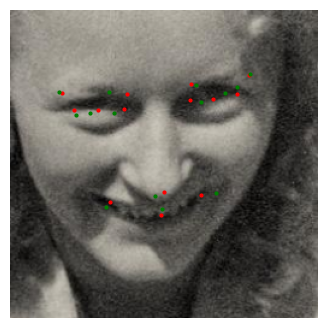

id: 4


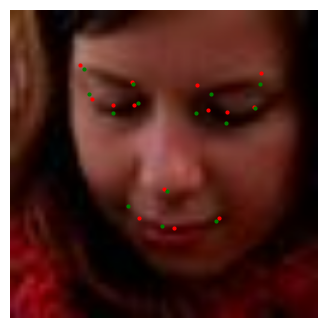

id: 492


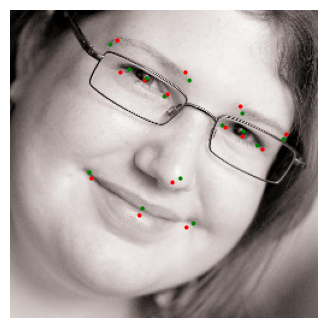

In [275]:
for _ in range(15):
    i = int(np.random.uniform(0,500)) 
    print(f'id: {i}')
    predict_and_show_one_image(resnet_model_best, test_ds[i])

### Grid Search

Проверил 4 оптимизатора: <b>Adam</b>, <b>NAdam</b>, <b>Adamw</b> и <b>SGD(nesterom=True)</b>. Решил остановится на <b>AdamW</b>, в дальнейшем grid search'ем подбирал для него weight_decay. Впринципе было бы хорошо ещё подобрать и $\beta_1$, $\beta_2$, а также $\epsilon$, но времени не хватило. Также решил отказаться от amsgrad после тестов с ним и без него.

Сравнил разные scheduler'ы: <b>CosineAnnealingWarmRestarts</b>, <b>StepLR</b> и <b>CyclicLR</b>. Остановился на StepLR с шагом 20-25 эпох и $\gamma=0.25$

Также попробовал использовать <b>LinearWarmup</b> ([откуда брал идею](https://www.linkedin.com/pulse/learning-rate-cosine-decay-warmup-hold-period-karel-becerra-fppye/)). Также решил оставить.

In [30]:
min_test_acc = np.inf

In [31]:
# Изменил функцию, добавив warmup и scheduler
# Training function.
def train(model, trainloader, optimizer, criterion, warmup = None, scheduler = None):
    model.train()
    print('Training')
    train_running_loss = 0.0
    train_running_correct = 0.0
    counter = 0
    for i, data in tqdm(enumerate(trainloader), total=len(trainloader)):
        counter += 1
        image, labels = data
        image = image.to(DEVICE)
        labels = labels.to(DEVICE)

        optimizer.zero_grad()
        
        # Forward pass.
        outputs = model(image)
        
        # Вычисляем loss.
        loss = criterion(outputs, labels)
        train_running_loss += loss.item()
        
        # Вычисляем MSE.
        preds = outputs.data
        train_running_correct += mean_squared_error(preds, labels).item()
        
        # Backpropagation
        loss.backward()
        
        # Обнавляем веса и делаем шаг
        optimizer.step()
        if warmup:
            with warmup_scheduler.dampening():
                if warmup_scheduler.last_step + 1 >= warmup_period:
                    lr_scheduler.step()
        elif scheduler:
            scheduler.step()
            
    # Loss и MSE на текущей эпохе.
    epoch_loss = train_running_loss / counter
    epoch_acc = train_running_correct / counter
    return epoch_loss, epoch_acc

In [12]:
epochs = 32
batch_size = 64
steps_per_epoch = 62.5
warmup_period = 70
# num_steps = steps_per_epoch * epochs - warmup_period
# t0 = num_steps // 3
learning_rate = 1e-4

In [28]:
train_ds = FacialKeypointDataset(df[:4000], 'train', train_transforms)
val_ds = FacialKeypointDataset(df[4000:4500], 'val', val_transforms)
test_ds = FacialKeypointDataset(df[4500:], 'val', val_transforms)

train_dataloader = DataLoader(train_ds, batch_size=batch_size, shuffle=True) # sampler=sampler shuffle=True
val_dataloader = DataLoader(val_ds, batch_size=batch_size, shuffle=False)
test_dataloader = DataLoader(test_ds, batch_size=batch_size, shuffle=False)

In [371]:
for learning_rate in [1e-3]:
    for wd in [1e-3, 1e-2]:
        # Model
        # resnet_model = ResNet(num_classes=n_labels).to(DEVICE)
        model = EfficientNet(num_classes=n_labels).to(DEVICE)
        # Optimizer.
        optimizer = optim.AdamW(model.parameters(),lr=learning_rate, weight_decay=wd)
        # lr_scheduler = optim.lr_scheduler.CosineAnnealingWarmRestarts(
        #                                         optimizer, T_0=t0, T_mult=1, eta_min=lr_min)
        # lr_scheduler = optim.lr_scheduler.CyclicLR(
        #     optimizer, base_lr=5e-4, max_lr=5e-3, cycle_momentum=False, mode="triangular", step_size_up=500)
        
        lr_scheduler = optim.lr_scheduler.StepLR(optimizer, 1575, gamma=0.25)
        warmup_scheduler = warmup.LinearWarmup(optimizer, warmup_period)
        
        # Loss function.
        criterion = WingLoss()
        
        train_loss, test_loss = [], []
        train_acc, test_acc = [], []
    
        for epoch in range(epochs):
            print(f"[INFO]: Epoch {epoch+1} of {epochs}")
            train_epoch_loss, train_epoch_acc = train(
                model, 
                train_dataloader, 
                optimizer,
                criterion,
                warmup_scheduler,
                lr_scheduler,
            )
            
            test_epoch_loss, test_epoch_acc = test(
                model, 
                val_dataloader, 
                criterion,
            )
    
            if  test_epoch_acc < min_test_acc:
                min_test_acc = test_epoch_acc
                best_model = copy.deepcopy(model)
                inf = {
                    'learning rate': learning_rate,
                    'wd': wd
                }
                
                print(min_test_acc, inf)
    
            train_loss.append(train_epoch_loss)    
            test_loss.append(test_epoch_loss)
            train_acc.append(train_epoch_acc)
            test_acc.append(test_epoch_acc)
            print(f"Training loss: {train_epoch_loss:.3f}, training acc: {train_epoch_acc:.3f}")
            print(f"Test loss: {test_epoch_loss:.3f}, test acc: {test_epoch_acc:.3f}")
            print('-'*50)
                
        # Save the loss and accuracy plots.
        save_plots(
            train_acc, 
            test_acc, 
            train_loss, 
            test_loss,
        )
                
        print('TRAINING COMPLETE')

[INFO]: Epoch 1 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:45<00:00,  1.33it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.30it/s]


Training loss: 0.573, training acc: 34.031
Test loss: 0.440, test acc: 11.087
--------------------------------------------------
[INFO]: Epoch 2 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:38<00:00,  1.43it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.32it/s]


Training loss: 0.196, training acc: 2.867
Test loss: 0.166, test acc: 1.667
--------------------------------------------------
[INFO]: Epoch 3 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:46<00:00,  1.33it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.46it/s]


Training loss: 0.176, training acc: 2.180
Test loss: 0.167, test acc: 1.729
--------------------------------------------------
[INFO]: Epoch 4 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:46<00:00,  1.32it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.09it/s]


Training loss: 0.164, training acc: 1.874
Test loss: 0.161, test acc: 1.549
--------------------------------------------------
[INFO]: Epoch 5 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:39<00:00,  1.41it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.39it/s]


Training loss: 0.163, training acc: 1.837
Test loss: 0.163, test acc: 1.636
--------------------------------------------------
[INFO]: Epoch 6 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:46<00:00,  1.33it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.53it/s]


Training loss: 0.161, training acc: 1.782
Test loss: 0.206, test acc: 2.381
--------------------------------------------------
[INFO]: Epoch 7 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:47<00:00,  1.31it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.34it/s]


Training loss: 0.154, training acc: 1.632
Test loss: 0.145, test acc: 1.335
--------------------------------------------------
[INFO]: Epoch 8 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:49<00:00,  1.29it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.57it/s]


Training loss: 0.158, training acc: 1.991
Test loss: 0.174, test acc: 1.757
--------------------------------------------------
[INFO]: Epoch 9 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:48<00:00,  1.30it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.61it/s]


Training loss: 0.153, training acc: 1.622
Test loss: 0.187, test acc: 2.131
--------------------------------------------------
[INFO]: Epoch 10 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:45<00:00,  1.33it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.42it/s]


Training loss: 0.151, training acc: 1.563
Test loss: 0.167, test acc: 1.637
--------------------------------------------------
[INFO]: Epoch 11 of 50
Training


 33%|█████████████████▎                                  | 47/141 [00:33<01:07,  1.38it/s]


KeyboardInterrupt: 

In [32]:
final_loss, final_acc = test(best_model, test_dataloader, criterion)
final_loss, final_acc

Test


100%|█████████████████████████████████████████████| 8/8 [00:02<00:00,  3.24it/s]


(0.12652101274579763, 2.1297435462474823)

In [34]:
inf

{'learning rate': 0.001, 'wd': 0.001}

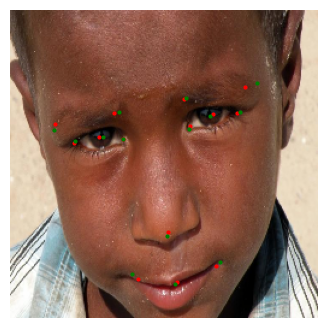

In [33]:
# плохо определённая картинка на бейзлайне стала лучше
predict_and_show_one_image(best_model, test_ds[3])

id: 258


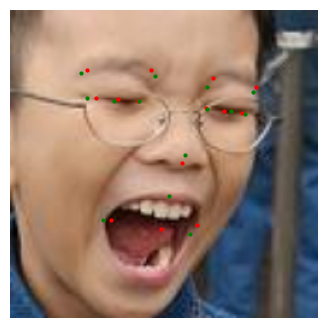

id: 400


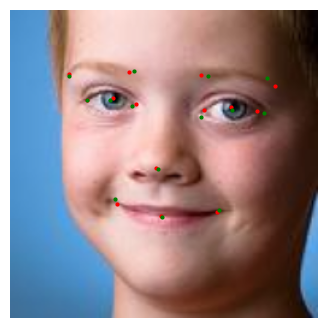

id: 415


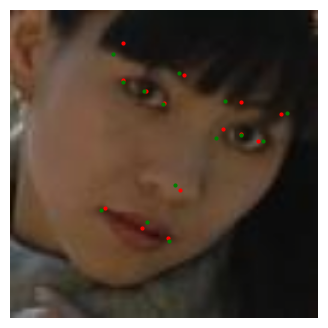

id: 131


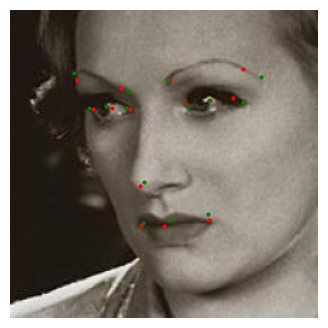

id: 413


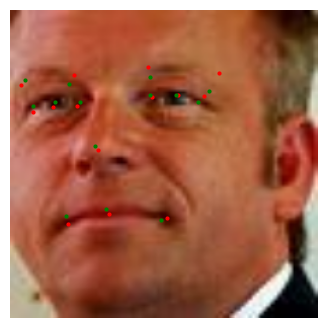

id: 359


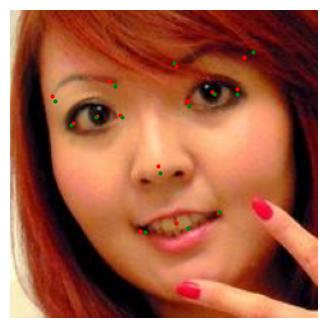

id: 442


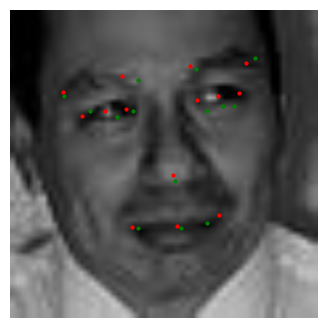

id: 408


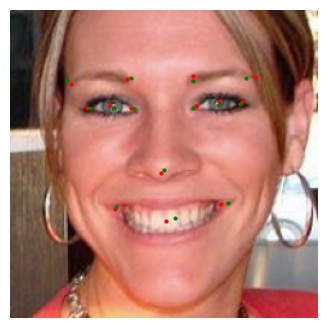

id: 38


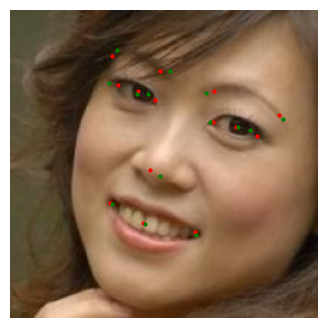

id: 227


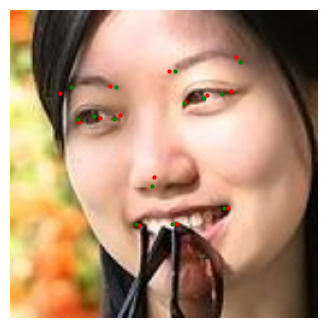

id: 382


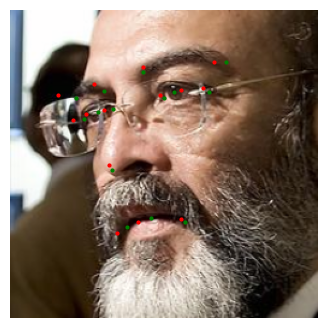

id: 282


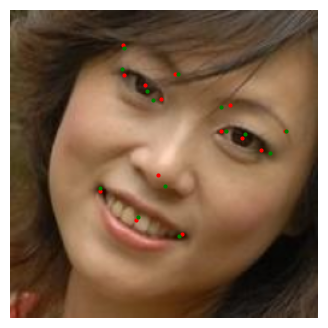

id: 221


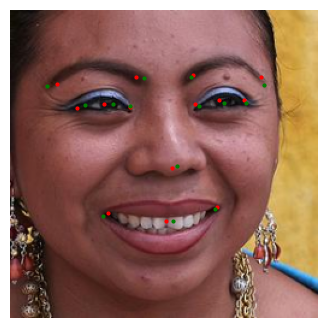

id: 288


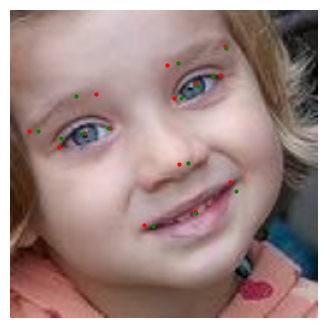

id: 477


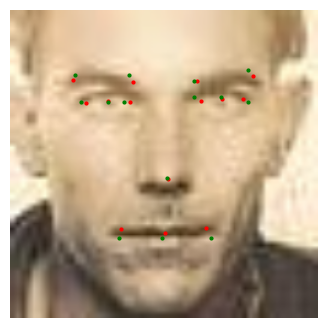

In [35]:
for _ in range(15):
    i = int(np.random.uniform(0,500)) 
    print(f'id: {i}')
    predict_and_show_one_image(best_model, test_ds[i])

## Train with pretrain on WFLW

# Итоговый пайплайн и некоторые замечания по задаче

Наконец решил сменить претрейн и обучил EfficientNet B5 на датасете WFLW. По итогам претрейна и последующей оптимизациии, модель показала наилучший результат без заморозки каких-либо слоёв. 

<b>Итоговый пайплайн</b>:

Augmentations: HorizontalFlip, Rotate, Resize, ShiftScaleRotate, RandomBrightnessContrast + OneOf(Gaussian, CLAHE, ImageCompression, RandomGamma, Blur, Posterize)

Criterion: WingLoss

Model: EfficientNetB5 with pretrained weights on  WFLW dataset

Optimizer: AdamW

Scheduler: StepLR

Warmup: LinearWarmup


<b>Замечания</b>:

В данной [статье](https://arxiv.org/pdf/2101.10808) также упоминается решение задачи используя heatmap как выходной слой, например с помощью архитектуры Hourglass. Потенциально можно было бы попробовать ещё и это, но на это потребовалось бы больше времени. Также можно было бы попробовать собрать больше данных для претрейна,взять более хорошую модель, чем EfficientNetB5(тут ограничения в вычислительные способности моей машины), потренировать на большем наборе гиперпараметров для AdamW и в том числе попробовать дополнительные аугментации как ElasticTransform.

Итоговая модель слаба к изображениям с очками на лице а также когда лицо повёрнуто слишком сильно. Эту бы проблему можно было бы решить большим набором данных(тут бы могли бы помочь автоэнкодеры(VAE, GAN), с латентным вектором очков для аугментаций, как вариант, но дешевле, конечно данные собрать просто)

Также сам датасет содержит некоторые ошибки в разметке, что вполне могло повлиять на итоговую точность модели

In [77]:
# Сделал претрейн на датасете WFLW и сохранил веса, чтобы далее использовать в текущей задаче
class EfficientNet(nn.Module):
    def __init__(self, num_classes=28, PATH='pretrain2.pth'): 
        super(EfficientNet, self).__init__()
        self.efficientnet = models.efficientnet_b5(weights=None)
        self.efficientnet.classifier = nn.Sequential(
            nn.Dropout(p=0.4, inplace=True),
            nn.Linear(in_features=2048, out_features=196)
        )
        try:
            self.efficientnet.load_state_dict(torch.load(PATH, map_location=DEVICE, weights_only=True), strict=False)
            
        except FileNotFoundError:
            print(f"Error: Pre-trained model file not found at {PATH}")
        except Exception as e:
            print(f"Error loading model: {e}")
            
        # Замораживаю pre-trained слои
        # ct = 0
        # for child in self.efficientnet.children():
        #     ct += 1
        #     if ct < 2:
        #         for param in child.parameters():
        #             param.requires_grad = False
                    
        # Изменяю классификатор под мою задачу
        self.efficientnet.classifier = nn.Sequential(
            nn.Dropout(p=0.4, inplace=True),
            nn.Linear(in_features=2048, out_features=28)
        )   
    def forward(self, x):
        x = self.efficientnet(x)
        return x

In [78]:
train_ds = FacialKeypointDataset(df[:4500], 'train', train_transforms)
val_ds = FacialKeypointDataset(df[4500:], 'val', val_transforms)

train_dataloader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
val_dataloader = DataLoader(val_ds, batch_size=batch_size, shuffle=False)

In [80]:
epochs = 50
batch_size = 32
steps_per_epoch = 141
warmup_period = 150
n_labels=28
learning_rate = 1e-4

[INFO]: Epoch 1 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:32<00:00,  1.53it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.02it/s]


Training loss: 0.583, training acc: 34.923
Test loss: 0.369, test acc: 8.265
--------------------------------------------------
[INFO]: Epoch 2 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:31<00:00,  1.54it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  4.00it/s]


Training loss: 0.200, training acc: 3.482
Test loss: 0.155, test acc: 1.513
--------------------------------------------------
[INFO]: Epoch 3 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:32<00:00,  1.53it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.01it/s]


Training loss: 0.174, training acc: 2.115
Test loss: 0.249, test acc: 3.280
--------------------------------------------------
[INFO]: Epoch 4 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:32<00:00,  1.52it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  4.00it/s]


Training loss: 0.167, training acc: 1.902
Test loss: 0.156, test acc: 1.605
--------------------------------------------------
[INFO]: Epoch 5 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:32<00:00,  1.52it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.02it/s]


Training loss: 0.161, training acc: 1.840
Test loss: 0.189, test acc: 2.079
--------------------------------------------------
[INFO]: Epoch 6 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:31<00:00,  1.54it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.00it/s]


Training loss: 0.159, training acc: 1.775
Test loss: 0.155, test acc: 1.502
--------------------------------------------------
[INFO]: Epoch 7 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:32<00:00,  1.53it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.98it/s]


Training loss: 0.156, training acc: 1.685
Test loss: 0.166, test acc: 1.678
--------------------------------------------------
[INFO]: Epoch 8 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:31<00:00,  1.54it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.01it/s]


Training loss: 0.154, training acc: 1.633
Test loss: 0.141, test acc: 1.321
--------------------------------------------------
[INFO]: Epoch 9 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:32<00:00,  1.53it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.01it/s]


Training loss: 0.154, training acc: 1.633
Test loss: 0.150, test acc: 1.464
--------------------------------------------------
[INFO]: Epoch 10 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:33<00:00,  1.51it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.03it/s]


Training loss: 0.152, training acc: 1.562
Test loss: 0.172, test acc: 1.724
--------------------------------------------------
[INFO]: Epoch 11 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:31<00:00,  1.55it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.04it/s]


Training loss: 0.153, training acc: 1.626
Test loss: 0.166, test acc: 1.607
--------------------------------------------------
[INFO]: Epoch 12 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:31<00:00,  1.54it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.04it/s]


1.1349248960614204 {'learning rate': 0.001, 'wd': 0.0001}
Training loss: 0.148, training acc: 1.496
Test loss: 0.132, test acc: 1.135
--------------------------------------------------
[INFO]: Epoch 13 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:31<00:00,  1.54it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.05it/s]


Training loss: 0.150, training acc: 1.563
Test loss: 0.149, test acc: 1.449
--------------------------------------------------
[INFO]: Epoch 14 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:34<00:00,  1.49it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.78it/s]


Training loss: 0.147, training acc: 1.476
Test loss: 0.161, test acc: 1.577
--------------------------------------------------
[INFO]: Epoch 15 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:34<00:00,  1.49it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.75it/s]


Training loss: 0.147, training acc: 1.454
Test loss: 0.151, test acc: 1.387
--------------------------------------------------
[INFO]: Epoch 16 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:33<00:00,  1.51it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.81it/s]


Training loss: 0.143, training acc: 1.378
Test loss: 0.172, test acc: 1.737
--------------------------------------------------
[INFO]: Epoch 17 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:33<00:00,  1.50it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.11it/s]


Training loss: 0.142, training acc: 1.360
Test loss: 0.164, test acc: 1.618
--------------------------------------------------
[INFO]: Epoch 18 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:35<00:00,  1.48it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.95it/s]


Training loss: 0.141, training acc: 1.347
Test loss: 0.135, test acc: 1.183
--------------------------------------------------
[INFO]: Epoch 19 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:33<00:00,  1.51it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.97it/s]


Training loss: 0.140, training acc: 1.376
Test loss: 0.139, test acc: 1.237
--------------------------------------------------
[INFO]: Epoch 20 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:32<00:00,  1.52it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.96it/s]


Training loss: 0.141, training acc: 1.365
Test loss: 0.163, test acc: 1.584
--------------------------------------------------
[INFO]: Epoch 21 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:31<00:00,  1.54it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  4.00it/s]


Training loss: 0.141, training acc: 1.327
Test loss: 0.136, test acc: 1.195
--------------------------------------------------
[INFO]: Epoch 22 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:31<00:00,  1.54it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.03it/s]


1.0630056969821453 {'learning rate': 0.001, 'wd': 0.0001}
Training loss: 0.130, training acc: 1.158
Test loss: 0.127, test acc: 1.063
--------------------------------------------------
[INFO]: Epoch 23 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:31<00:00,  1.55it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.00it/s]


0.9888938516378403 {'learning rate': 0.001, 'wd': 0.0001}
Training loss: 0.126, training acc: 1.084
Test loss: 0.121, test acc: 0.989
--------------------------------------------------
[INFO]: Epoch 24 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:32<00:00,  1.52it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.00it/s]


0.9748030714690685 {'learning rate': 0.001, 'wd': 0.0001}
Training loss: 0.125, training acc: 1.056
Test loss: 0.121, test acc: 0.975
--------------------------------------------------
[INFO]: Epoch 25 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:32<00:00,  1.53it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  4.00it/s]


Training loss: 0.124, training acc: 1.050
Test loss: 0.123, test acc: 0.998
--------------------------------------------------
[INFO]: Epoch 26 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:31<00:00,  1.53it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.99it/s]


0.9697001613676548 {'learning rate': 0.001, 'wd': 0.0001}
Training loss: 0.122, training acc: 1.018
Test loss: 0.121, test acc: 0.970
--------------------------------------------------
[INFO]: Epoch 27 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:33<00:00,  1.51it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.03it/s]


Training loss: 0.122, training acc: 1.006
Test loss: 0.121, test acc: 0.983
--------------------------------------------------
[INFO]: Epoch 28 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:31<00:00,  1.53it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.99it/s]


Training loss: 0.121, training acc: 1.000
Test loss: 0.122, test acc: 0.985
--------------------------------------------------
[INFO]: Epoch 29 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:32<00:00,  1.52it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.79it/s]


Training loss: 0.121, training acc: 0.990
Test loss: 0.130, test acc: 1.089
--------------------------------------------------
[INFO]: Epoch 30 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:35<00:00,  1.48it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.76it/s]


Training loss: 0.121, training acc: 0.989
Test loss: 0.124, test acc: 1.021
--------------------------------------------------
[INFO]: Epoch 31 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:33<00:00,  1.50it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.72it/s]


Training loss: 0.120, training acc: 0.981
Test loss: 0.131, test acc: 1.081
--------------------------------------------------
[INFO]: Epoch 32 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:34<00:00,  1.49it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.69it/s]


Training loss: 0.119, training acc: 0.964
Test loss: 0.122, test acc: 0.990
--------------------------------------------------
[INFO]: Epoch 33 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:33<00:00,  1.51it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.08it/s]


Training loss: 0.118, training acc: 0.947
Test loss: 0.128, test acc: 1.071
--------------------------------------------------
[INFO]: Epoch 34 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:33<00:00,  1.51it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.67it/s]


Training loss: 0.118, training acc: 0.941
Test loss: 0.123, test acc: 1.019
--------------------------------------------------
[INFO]: Epoch 35 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:35<00:00,  1.48it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.70it/s]


Training loss: 0.117, training acc: 0.926
Test loss: 0.124, test acc: 1.016
--------------------------------------------------
[INFO]: Epoch 36 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:35<00:00,  1.48it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.70it/s]


Training loss: 0.116, training acc: 0.912
Test loss: 0.124, test acc: 1.015
--------------------------------------------------
[INFO]: Epoch 37 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:34<00:00,  1.49it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.84it/s]


Training loss: 0.116, training acc: 0.919
Test loss: 0.124, test acc: 1.026
--------------------------------------------------
[INFO]: Epoch 38 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:34<00:00,  1.49it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.01it/s]


Training loss: 0.115, training acc: 0.897
Test loss: 0.126, test acc: 1.062
--------------------------------------------------
[INFO]: Epoch 39 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:31<00:00,  1.53it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.99it/s]


Training loss: 0.115, training acc: 0.893
Test loss: 0.125, test acc: 1.041
--------------------------------------------------
[INFO]: Epoch 40 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:31<00:00,  1.53it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.02it/s]


Training loss: 0.114, training acc: 0.881
Test loss: 0.136, test acc: 1.219
--------------------------------------------------
[INFO]: Epoch 41 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:31<00:00,  1.54it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.06it/s]


Training loss: 0.113, training acc: 0.873
Test loss: 0.123, test acc: 1.012
--------------------------------------------------
[INFO]: Epoch 42 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:32<00:00,  1.52it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.01it/s]


Training loss: 0.110, training acc: 0.828
Test loss: 0.121, test acc: 0.994
--------------------------------------------------
[INFO]: Epoch 43 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:32<00:00,  1.52it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.01it/s]


Training loss: 0.108, training acc: 0.803
Test loss: 0.120, test acc: 0.987
--------------------------------------------------
[INFO]: Epoch 44 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:32<00:00,  1.53it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.02it/s]


Training loss: 0.109, training acc: 0.811
Test loss: 0.121, test acc: 0.997
--------------------------------------------------
[INFO]: Epoch 45 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:32<00:00,  1.52it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.78it/s]


Training loss: 0.108, training acc: 0.799
Test loss: 0.122, test acc: 1.000
--------------------------------------------------
[INFO]: Epoch 46 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:32<00:00,  1.52it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.99it/s]


Training loss: 0.108, training acc: 0.799
Test loss: 0.120, test acc: 0.987
--------------------------------------------------
[INFO]: Epoch 47 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:35<00:00,  1.48it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:04<00:00,  3.99it/s]


Training loss: 0.107, training acc: 0.787
Test loss: 0.121, test acc: 1.000
--------------------------------------------------
[INFO]: Epoch 48 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:32<00:00,  1.52it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.01it/s]


Training loss: 0.107, training acc: 0.791
Test loss: 0.121, test acc: 0.995
--------------------------------------------------
[INFO]: Epoch 49 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:34<00:00,  1.49it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.03it/s]


Training loss: 0.107, training acc: 0.783
Test loss: 0.121, test acc: 0.997
--------------------------------------------------
[INFO]: Epoch 50 of 50
Training


100%|███████████████████████████████████████████████████| 141/141 [01:32<00:00,  1.53it/s]


Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.06it/s]


Training loss: 0.106, training acc: 0.774
Test loss: 0.122, test acc: 1.013
--------------------------------------------------
TRAINING COMPLETE


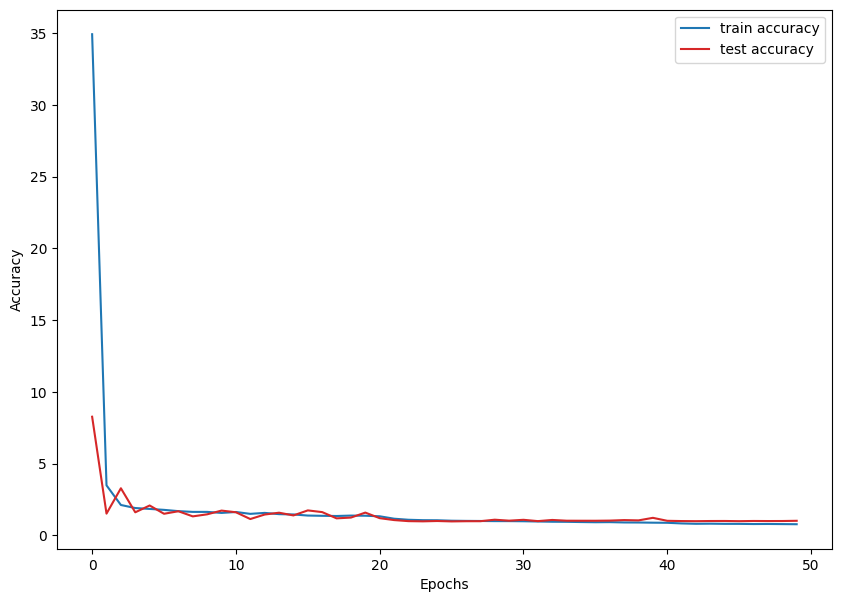

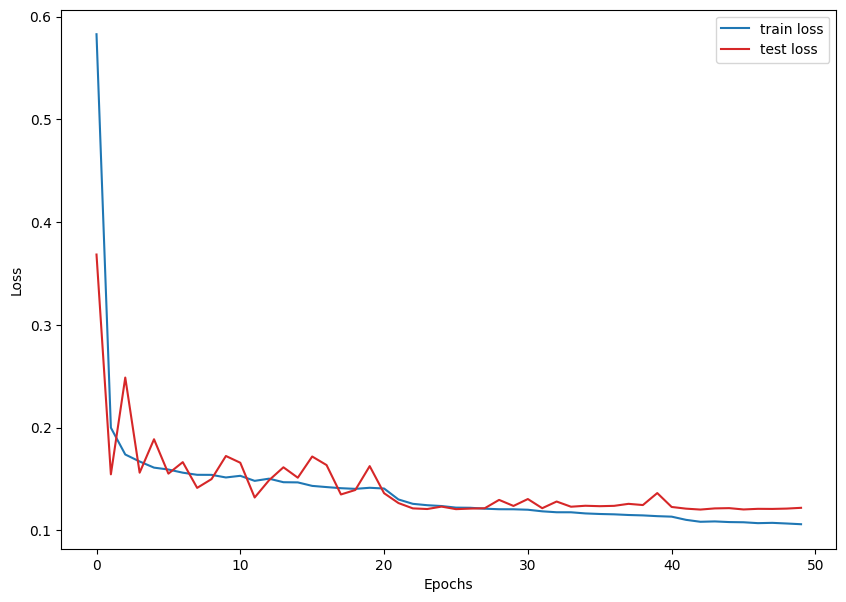

In [81]:
for learning_rate in [1e-3]:
    for wd in [1e-4]: #1e-3
        
        # Model
        eff_model = EfficientNet(num_classes=n_labels).to(DEVICE)
        
        # Optimizer.
        optimizer = optim.AdamW(eff_model.parameters(),lr=learning_rate, weight_decay=wd)
        lr_scheduler = optim.lr_scheduler.StepLR(optimizer, 2820, gamma=0.25)
        warmup_scheduler = warmup.LinearWarmup(optimizer, warmup_period)
        
        # Loss function.
        criterion = WingLoss()
        
        train_loss, test_loss = [], []
        train_acc, test_acc = [], []
    
        for epoch in range(epochs):
            print(f"[INFO]: Epoch {epoch+1} of {epochs}")
            train_epoch_loss, train_epoch_acc = train(
                eff_model, 
                train_dataloader, 
                optimizer,
                criterion,
                warmup_scheduler,
                lr_scheduler,
            )
            
            test_epoch_loss, test_epoch_acc = test(
                eff_model, 
                val_dataloader, 
                criterion,
            )
    
            if  test_epoch_acc < min_test_acc:
                min_test_acc = test_epoch_acc
                best_eff_model = copy.deepcopy(eff_model)
                inf = {
                    'learning rate': learning_rate,
                    'wd': wd
                }
                
                print(min_test_acc, inf)
    
            train_loss.append(train_epoch_loss)    
            test_loss.append(test_epoch_loss)
            train_acc.append(train_epoch_acc)
            test_acc.append(test_epoch_acc)
            print(f"Training loss: {train_epoch_loss:.3f}, training acc: {train_epoch_acc:.3f}")
            print(f"Test loss: {test_epoch_loss:.3f}, test acc: {test_epoch_acc:.3f}")
            print('-'*50)

        
        save_plots(
            train_acc, 
            test_acc, 
            train_loss, 
            test_loss,
        )
                
        print('TRAINING COMPLETE')

In [92]:
final_loss, final_acc = test(best_eff_model, val_dataloader, criterion)
final_loss, final_acc

Test


100%|█████████████████████████████████████████████████████| 16/16 [00:03<00:00,  4.16it/s]


(0.1206749496050179, 0.9697001613676548)

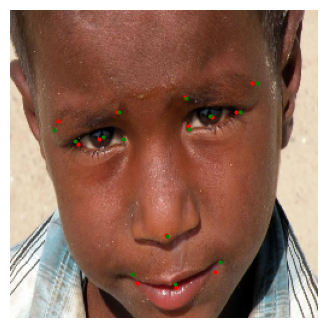

In [82]:
# плохо определённая картинка на бейзлайне стала намного лучше
predict_and_show_one_image(best_eff_model, val_ds[3])

id: 498


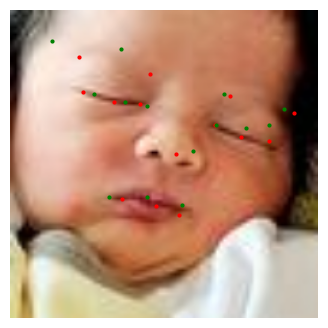

id: 172


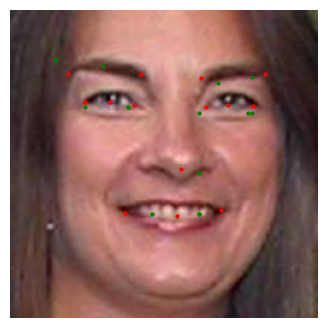

id: 60


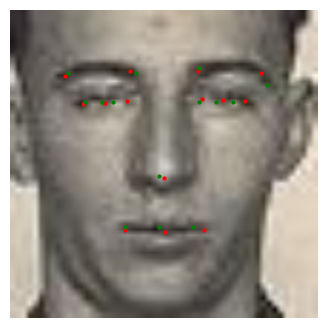

id: 62


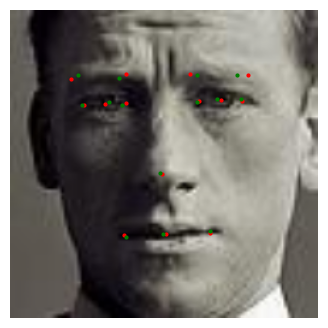

id: 228


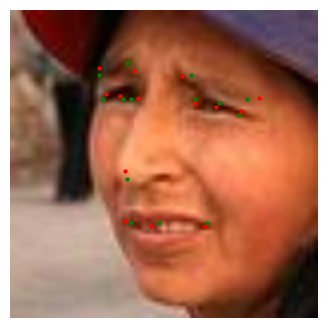

id: 252


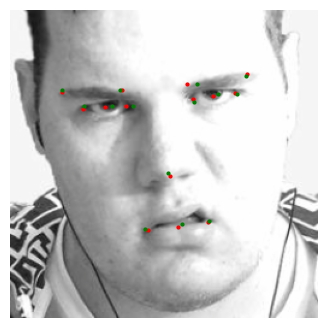

id: 335


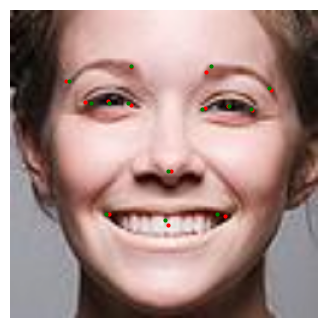

id: 188


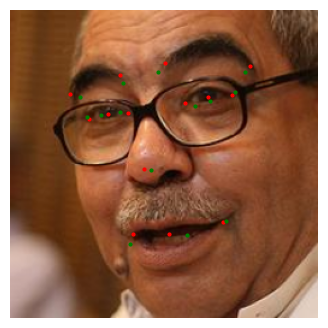

id: 378


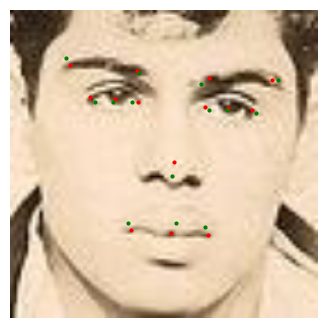

id: 4


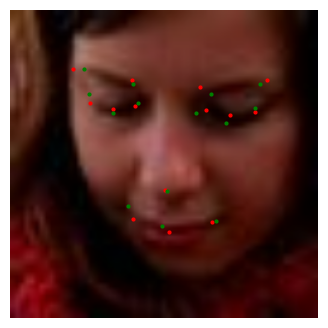

id: 151


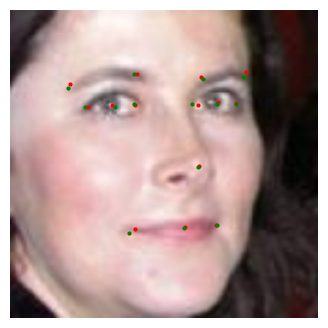

id: 127


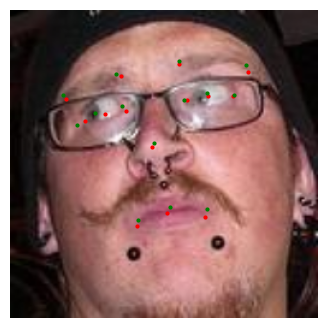

id: 387


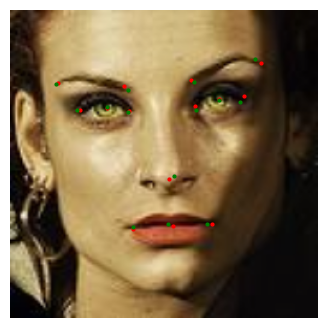

id: 411


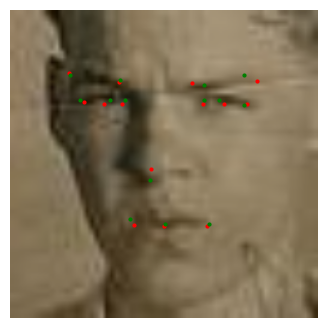

id: 68


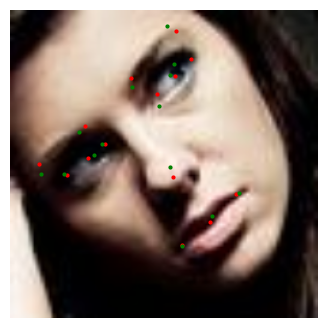

In [86]:
for _ in range(15):
    i = int(np.random.uniform(0,500)) 
    print(f'id: {i}')
    predict_and_show_one_image(best_eff_model, val_ds[i])

# Submit

In [257]:
submit_df = pd.DataFrame(columns=df.columns)
for filename in test_files:
    submit_df.loc[len(submit_df)] = [filename] + [np.nan]*28
submit_df['filename'] = submit_df['filename'].apply(lambda text: 'test/'+text) 

In [258]:
submit_df.head()

,filename,x1,y1,x2,y2,x3,y3,x4,y4,x5,...,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14
0,test/00008.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,test/00014.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,test/00015.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,test/00017.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,test/00023.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [259]:
submit_ds = FacialKeypointDataset(submit_df, 'test', val_transforms)
submit_dataloader = DataLoader(submit_ds, batch_size=1, shuffle=False)

In [260]:
results = []
best_eff_model.eval()
with torch.no_grad():
    for i, data in tqdm(enumerate(submit_dataloader), total=len(submit_dataloader)):
        image, labels = data
        image = image.to(DEVICE)
        labels = labels.to(DEVICE)
        
        # Forward pass.
        outputs = best_eff_model(image)
        results.append(outputs.data)

100%|█████████████████████████████████████████████████| 1000/1000 [00:48<00:00, 20.44it/s]


In [261]:
for i in range(len(submit_df)):
    cur_width, cur_height = Image.open(submit_df.iloc[i,0]).size
    results[i] = results[i].flatten().detach().cpu().numpy() 
    results[i][0::2] = np.round((results[i][0::2]+1)*cur_width / 2)
    results[i][1::2] = np.round((results[i][1::2]+1)*cur_height / 2)
    submit_df.iloc[i,1:] = results[i]

In [262]:
for col in submit_df.columns[1:]:
    submit_df[f'{col}'] = submit_df[f'{col}'].astype(int)

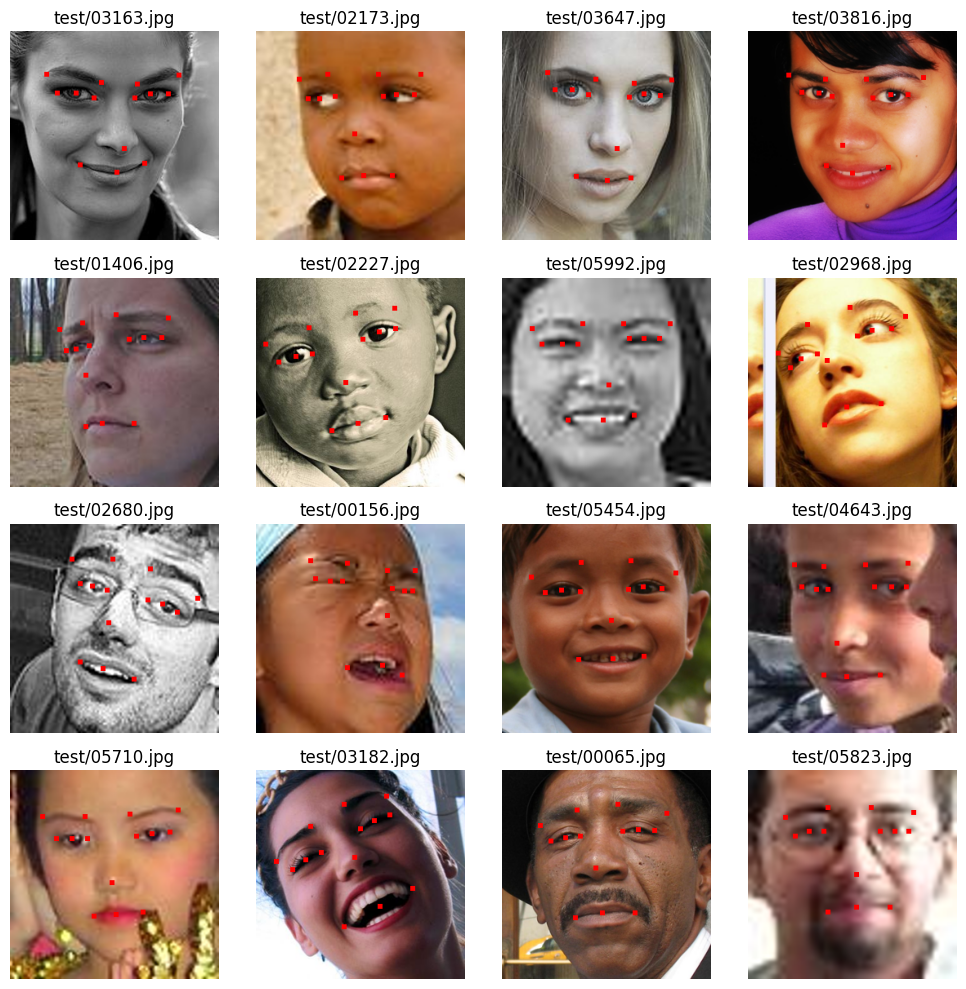

In [303]:
# Проверяю насколько хорошо сработал предикт и проверяю на качественный post-proceccing 
fig, ax = plt.subplots(nrows=4, ncols=4, figsize=(10, 10), sharey=True, sharex=True)
for fig_x in ax.flatten():
    random_sample = submit_df.sample(1)

    path = f'test/{random_sample['filename'].values[0]}'
    image = Image.open(path)
    cur_width, cur_height = image.size
    new_width, new_height = 256, 256  # Определяю фиксированную длину и ширину для resize
    image = image.resize((new_width, new_height))
 
    draw = ImageDraw.Draw(image)   
    
    temp = submit_df.loc[submit_df['filename'] == path[5:]].iloc[:, 1:].values.flatten()
    temp = [temp[i] / cur_width * new_width if i % 2 == 0 else temp[i] / cur_height * new_height for i in range(28)]
    
    for i in range(len(temp) // 2):
        draw.regular_polygon((int(temp[2 * i]), int(temp[2 * i + 1]), 4), n_sides=4, fill=(256, 0, 0))
    
    img_array = np.array(image)
    fig_x.set_title(path)
    fig_x.imshow(img_array)
    fig_x.axis('off')

plt.tight_layout()
plt.show()

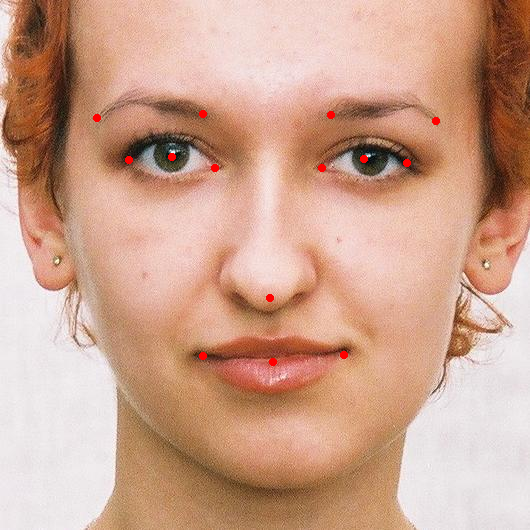

In [370]:
# Проверяю, но уже без ресайза

path = submit_df.sample(1)['filename'].values[0]

image = Image.open(f"test/{path}")
cur_width, cur_height = image.size

draw = ImageDraw.Draw(image)

temp = submit_df.loc[submit_df['filename'] == path].iloc[:, 1:].values.flatten()
temp = [temp[i] for i in range(28)]

for i in range(len(temp) // 2):
    draw.regular_polygon((int(temp[2 * i]), int(temp[2 * i + 1]), 4), n_sides=12, fill=(256, 0, 0))

image.show()

In [277]:
submit_df['filename'] = submit_df['filename'].apply(lambda text: text[5:]) # изменяю путь к фоткам

In [359]:
# submit_df.to_csv('submition.csv', index=False)